<center>
<hr>
<h1>Python Crash Course</h1>
<h3>PhD Programme in Sociology and Social Research</h3> 
<h3>Michele Tizzoni</h3>
<h2>Notebook 3 - Data analysis with geopandas, statsmodels, networkX</h2>
<hr>
</center>

The aim of the third lesson is to:
 - show you how to analyze geolocalized data
 - show you how to build simple statistical models (linear regressions or similar)
 - show you how to analyze relational data such as social networks and visualize them

# 1. Geopandas

GeoPandas is a project to add support for geographic data to
[pandas](http://pandas.pydata.org) objects.  It currently implements
`GeoSeries` and `GeoDataFrame` types which are subclasses of
`pandas.Series` and `pandas.DataFrame` respectively.  GeoPandas
objects can act on [shapely](http://shapely.readthedocs.io/en/latest/)
geometry objects and perform geometric operations.

Documentation is available at [geopandas.org](http://geopandas.org)
(current release) and
[Read the Docs](http://geopandas.readthedocs.io/en/latest/)
(release and development versions).


## Installation

See the [installation docs](https://geopandas.org/en/latest/getting_started/install.html)
for all details. GeoPandas depends on the following packages:

- ``pandas``
- ``shapely``
- ``fiona``
- ``pyproj``
- ``packaging``

Further, ``matplotlib`` is an optional dependency, required for plotting.
Those packages depend on several low-level libraries for geospatial analysis, which can be a challenge to install. Therefore, we recommend to install GeoPandas using the [conda package manager](https://conda.io/en/latest/). See the [installation docs](https://geopandas.readthedocs.io/en/latest/install.html) for more details.


In [2]:
import geopandas as gpd

GeoPandas, as the name suggests, extends the popular data science library [pandas](https://pandas.pydata.org) by adding support for geospatial data. If you are not familiar with `pandas`, we recommend taking a quick look at its [Getting started documentation](https://pandas.pydata.org/docs/getting_started/index.html#getting-started) before proceeding.

The core data structure in GeoPandas is the `geopandas.GeoDataFrame`, a subclass of `pandas.DataFrame`, that can store geometry columns and perform spatial operations. The `geopandas.GeoSeries`, a subclass of `pandas.Series`, handles the geometries. Therefore, your `GeoDataFrame` is a combination of `pandas.Series`, with traditional data (numerical, boolean, text etc.), and `geopandas.GeoSeries`, with geometries (points, polygons etc.). You can have as many columns with geometries as you wish; there's no limit typical for desktop GIS software.

![geodataframe schema](./dataframe.svg)

Each `GeoSeries` can contain any geometry type (you can even mix them within a single array) and has a `GeoSeries.crs` attribute, which stores information about the projection (CRS stands for Coordinate Reference System). Therefore, each `GeoSeries` in a `GeoDataFrame` can be in a different projection, allowing you to have, for example, multiple versions (different projections) of the same geometry.



Let's see how some of these concepts work in practice.


## Reading files

We can read geospatial data stored in different file types: GeoPackage, GeoJSON, Shapefile. Shapefiles are the most common and they are often available from public repositories of statistical offices.

### Shapefiles
The shapefile format is a digital vector storage format for storing geographic location and associated attribute information. The shapefile format was introduced by ESRI with ArcGIS version 2 in the early 1990s. It is now possible to read and write geographical datasets using the shapefile format with a wide variety of software.

The shapefile format stores the geometry as primitive geometric shapes like points, lines, and polygons. These shapes, together with data attributes that are linked to each shape, create the representation of the geographic data. 

The term "shapefile" is quite common, but the format consists of a collection of files with a common filename prefix, stored in the same directory. 
The three mandatory files have extensions <code>.shp</code>, <code>.shx</code>, and <code>.dbf</code>. 

The actual "shapefile" relates specifically to the <code>.shp</code> file, but alone is incomplete for distribution as the other supporting files are required. 

Mandatory files :
* <code>.shp</code> — shape format; the feature geometry itself;
* <code>.shx</code> — shape index format; a positional index of the feature geometry to allow seeking forwards and backwards quickly;
* <code>.dbf</code> — attribute format; columnar attributes for each shape.

Other files :
* <code>.prj</code> — projection description, using a well-known text representation of coordinate reference systems.
* <code>.sbn</code> and <code>.sbx</code> — a spatial index of the features.




The package <code>geodatasets</code> provides access to a set of geospatial datasets. 

You can see the documentation of the available datasets here: https://geodatasets.readthedocs.io/en/latest/

In [3]:
import geodatasets

In [4]:
geodatasets.data

{'geoda': {'airbnb': {'url': 'https://geodacenter.github.io/data-and-lab//data/airbnb.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.airbnb',
   'description': 'Airbnb rentals, socioeconomics, and crime in Chicago',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//airbnb/',
   'hash': 'a2ab1e3f938226d287dd76cde18c00e2d3a260640dd826da7131827d9e76c824',
   'filename': 'airbnb.zip'},
  'atlanta': {'url': 'https://geodacenter.github.io/data-and-lab//data/atlanta_hom.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.atlanta',
   'description': 'Atlanta, GA region homicide counts and rates',
   'geometry_type': 'Polygon',
   'nrows': 90,
   'ncols': 24,
   'details': 'https://geodacenter.github.io/data-and-lab//atlanta_old/',
   'hash': 'a33a76e12168fe84361e60c88a9df4856730487305846c559715c89b1a2b5e09',
   'filename': 'atlanta_hom.zip',
   'members': ['atlanta_hom/atl_hom.geojson']},
  'cars': {'url': 'https://geodacenter.github.io/data-and-lab//data/Abandoned_Vehicles_Map.csv',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.cars',
   'description': '2011 abandoned vehicles in Chicago (311 complaints).',
   'geometry_type': 'Point',
   'nrows': 137867,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//1-source-and-description/',
   'hash': '6a0b23bc7eda2dcf1af02d43ccf506b24ca8d8c6dc2fe86a2a1cc051b03aae9e',
   'filename': 'Abandoned_Vehicles_Map.csv'},
  'charleston1': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston1',
   'description': '2000 Census Tract Data for Charleston, SC MSA and counties',
   'geometry_type': 'Polygon',
   'nrows': 117,
   'ncols': 31,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston-1_old/',
   'hash': '4a4fa9c8dd4231ae0b2f12f24895b8336bcab0c28c48653a967cffe011f63a7c',
   'filename': 'CharlestonMSA.zip',
   'members': ['CharlestonMSA/sc_final_census2.gpkg']},
  'charleston2': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA2.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston2',
   'description': '1998 and 2001 Zip Code Business Patterns (Census Bureau) for Charleston, SC MSA',
   'geometry_type': 'Polygon',
   'nrows': 42,
   'ncols': 60,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston2/',
   'hash': '056d5d6e236b5bd95f5aee26c77bbe7d61bd07db5aaf72866c2f545205c1d8d7',
   'filename': 'CharlestonMSA2.zip',
   'members': ['CharlestonMSA2/CharlestonMSA2.gpkg']},
  'chicago_health': {'url': 'https://geodacenter.github.io/data-and-lab//data/comarea.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_health',
   'description': 'Chicago Health + Socio-Economics',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 87,
   'details': 'https://geodacenter.github.io/data-and-lab//comarea_vars/',
   'hash': '4e872adb552786eae2fcd745524696e5e4cd33cc9a6c032471c0e75328871401',
   'filename': 'comarea.zip'},
  'chicago_commpop': {'url': 'https://geodacenter.github.io/data-and-lab//data/chicago_commpop.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_commpop',
   'description': 'Chicago Community Area Population Percent Change for 2000 and 2010',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 9,
   'details': 'https://geodacenter.github.io/data-and-lab//commpop/',
   'hash': '1dbebb50c8ea47e2279ea819ef64ba793bdee2b88e4716bd6c6ec0e0d8e0e05b',
   'filename': 'c

In [5]:
from geodatasets import get_path

Let's load the Airbnb data of Chicago 2015 (https://geodacenter.github.io/data-and-lab/airbnb/)

In [6]:
chicago_airbnb = gpd.read_file(get_path("geoda.airbnb"))

A `GeoDataFrame` looks exactly like a `DataFrame`

In [7]:
chicago_airbnb.head()

,community,shape_area,shape_len,AREAID,response_r,accept_r,rev_rating,price_pp,room_type,num_spots,...,crowded,dependency,without_hs,unemployed,income_pc,harship_in,num_crimes,num_theft,population,geometry
0,DOUGLAS,46004621.1581,31027.0545098,35,98.771429,94.514286,87.777778,78.157895,1.789474,38,...,1.8,30.7,14.3,18.2,23791,47,5013,1241,18238,"POLYGON ((-87.60914 41.84469, -87.60915 41.844..."
1,OAKLAND,16913961.0408,19565.5061533,36,99.200000,90.105263,88.812500,53.775000,1.850000,20,...,1.3,40.4,18.4,28.7,19252,78,1306,311,5918,"POLYGON ((-87.59215 41.81693, -87.59231 41.816..."
2,FULLER PARK,19916704.8692,NaN,37,68.000000,NaN,91.750000,84.000000,1.833333,6,...,3.2,44.9,26.6,33.9,10432,97,1764,383,2876,"POLYGON ((-87.62880 41.80189, -87.62879 41.801..."
3,GRAND BOULEVARD,48492503.1554,28196.8371573,38,94.037037,83.615385,92.750000,119.533333,1.533333,30,...,3.3,39.5,15.9,24.3,23472,57,6416,1428,21929,"POLYGON ((-87.60671 41.81681, -87.60670 41.816..."
4,KENWOOD,29071741.9283,23325.1679062,39,92.542857,88.142857,90.656250,77.991453,1.615385,39,...,2.4,35.4,11.3,15.7,35911,26,2713,654,17841,"POLYGON ((-87.59215 41.81693, -87.59215 41.816..."


the fundamental difference stands in the column `geometry`

In [8]:
chicago_airbnb['geometry']

0     POLYGON ((-87.60914 41.84469, -87.60915 41.844...
1     POLYGON ((-87.59215 41.81693, -87.59231 41.816...
2     POLYGON ((-87.62880 41.80189, -87.62879 41.801...
3     POLYGON ((-87.60671 41.81681, -87.60670 41.816...
4     POLYGON ((-87.59215 41.81693, -87.59215 41.816...
                            ...                        
72    POLYGON ((-87.69646 41.70714, -87.69644 41.706...
73    POLYGON ((-87.64215 41.68508, -87.64249 41.685...
74    MULTIPOLYGON (((-87.83658 41.98640, -87.83658 ...
75    POLYGON ((-87.65456 41.99817, -87.65456 41.998...
76    POLYGON ((-87.80676 42.00084, -87.80676 42.000...
Name: geometry, Length: 77, dtype: geometry

In [9]:
chicago_airbnb.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 77 entries, 0 to 76
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   community   77 non-null     object  
 1   shape_area  77 non-null     object  
 2   shape_len   76 non-null     object  
 3   AREAID      77 non-null     int64   
 4   response_r  68 non-null     float64 
 5   accept_r    67 non-null     float64 
 6   rev_rating  67 non-null     float64 
 7   price_pp    69 non-null     float64 
 8   room_type   69 non-null     float64 
 9   num_spots   77 non-null     int64   
 10  poverty     77 non-null     float64 
 11  crowded     77 non-null     float64 
 12  dependency  77 non-null     float64 
 13  without_hs  77 non-null     float64 
 14  unemployed  77 non-null     float64 
 15  income_pc   77 non-null     int64   
 16  harship_in  77 non-null     int64   
 17  num_crimes  77 non-null     int64   
 18  num_theft   77 non-null     int64   
 19  po

In [10]:
chicago_airbnb.explore()

# Plotting and mapping

In [11]:
import matplotlib.pyplot as plt

(-87.96091293145008, -87.50333825495426, 41.62561834903908, 42.04196336022515)

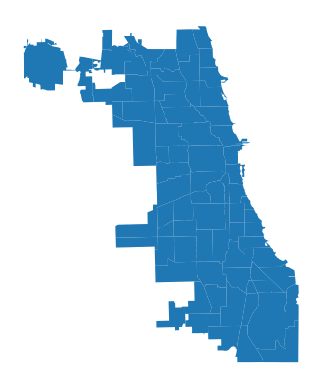

In [12]:
chicago_airbnb.plot()
plt.axis('off')

In [13]:
chicago_airbnb['crime_percapita']=chicago_airbnb['num_crimes']/chicago_airbnb['population']

In [14]:
from matplotlib import colormaps
list(colormaps)

['magma',
 'inferno',
 'plasma',
 'viridis',
 'cividis',
 'twilight',
 'twilight_shifted',
 'turbo',
 'Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'CMRmap',
 'GnBu',
 'Greens',
 'Greys',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'Wistia',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd',
 'afmhot',
 'autumn',
 'binary',
 'bone',
 'brg',
 'bwr',
 'cool',
 'coolwarm',
 'copper',
 'cubehelix',
 'flag',
 'gist_earth',
 'gist_gray',
 'gist_heat',
 'gist_ncar',
 'gist_rainbow',
 'gist_stern',
 'gist_yarg',
 'gnuplot',
 'gnuplot2',
 'gray',
 'hot',
 'hsv',
 'jet',
 'nipy_spectral',
 'ocean',
 'pink',
 'prism',
 'rainbow',
 'seismic',
 'spring',
 'summer',
 'terrain',
 'winter',
 'Accent',
 'Dark2',
 'Paired',
 'Pastel1',
 'Pastel2',
 'Set1',
 'Set2',
 'Set3',
 'tab10',
 'tab20',
 'tab20b',
 'tab20c',
 'magma_r',
 'inferno_r',
 'plasma_r',
 'viridis_r',
 'cividis_r',
 'twilight_r',
 'twilight

(-87.96091293145008, -87.50333825495426, 41.62561834903908, 42.04196336022515)

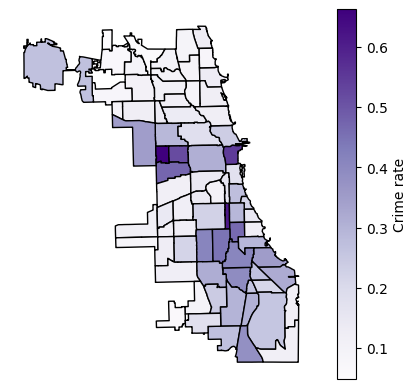

In [15]:
chicago_airbnb.plot(column='crime_percapita', 
                    cmap='Purples', 
                    edgecolor='k', 
                    legend_kwds={"label": "Crime rate"}, 
                    legend=True
                   )

plt.axis("off")

We may want to change the colormap and choose a better one. Here is a good guide about choosing a colormap: https://matplotlib.org/stable/users/explain/colors/colormaps.html

(-87.96091293145008, -87.50333825495426, 41.62561834903908, 42.04196336022515)

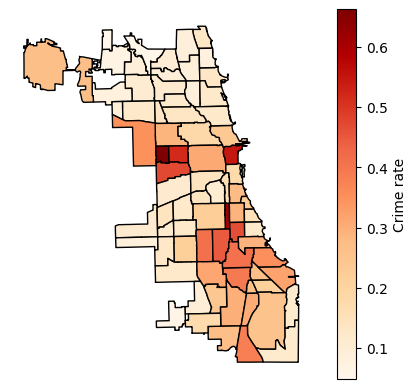

In [16]:
chicago_airbnb.plot(column='crime_percapita', 
                    cmap='OrRd', 
                    edgecolor='k', 
                    legend_kwds={"label": "Crime rate"}, 
                    legend=True
                   )

plt.axis("off")

## Spatial joins 

We usually have a dataset with some geospatial information and we want to map it. Let's go back to our Social Capital dataset, discussed in Notebook 2.

In [17]:
import pandas as pd

In [18]:
df_capital = pd.read_csv('./social_capital_county.csv')

In [19]:
df_capital.head()

,county,county_name,num_below_p50,pop2018,ec_county,ec_se_county,child_ec_county,child_ec_se_county,ec_grp_mem_county,ec_high_county,...,child_exposure_county,child_high_exposure_county,bias_grp_mem_county,bias_grp_mem_high_county,child_bias_county,child_high_bias_county,clustering_county,support_ratio_county,volunteering_rate_county,civic_organizations_county
0,1001,"Autauga, Alabama",5922.3921,55200.0,0.72077,0.00831,1.11754,0.02467,0.77223,1.21372,...,1.14816,1.19944,0.05526,-0.22748,0.02668,-0.08229,0.10347,0.98275,0.04355,0.01518
1,1003,"Baldwin, Alabama",15458.3960,208107.0,0.74313,0.00661,0.83064,0.01629,0.76215,1.28302,...,0.84588,1.00797,0.02950,-0.21519,0.01802,-0.05241,0.09624,0.98684,0.06117,0.01526
2,1005,"Barbour, Alabama",4863.9736,25782.0,0.41366,0.00978,0.58541,0.02707,0.35927,0.91897,...,0.63306,0.71967,0.13457,-0.34086,0.07528,-0.19714,0.14911,0.99911,0.02093,0.01474
3,1007,"Bibb, Alabama",3061.4934,22527.0,0.63152,0.01175,0.72265,0.03027,0.68094,1.06378,...,0.71433,0.72395,0.04108,-0.27727,-0.01165,-0.15993,0.14252,0.99716,0.05294,0.01439
4,1009,"Blount, Alabama",6740.9116,57645.0,0.72562,0.00985,0.76096,0.02466,0.79584,1.10569,...,0.74821,0.79375,0.00217,-0.24946,-0.01704,-0.08745,0.11243,0.99069,0.05704,0.01724


The dataset provides access to the EC Index at county level. If we want to map it, we need a **shapefile of the US Counties**.

A shapefile of the US counties is available from the US Census Bureau: https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html

In [20]:
us_counties = gpd.read_file("./cb_2018_us_county_5m/cb_2018_us_county_5m.shp")

In [21]:
us_counties.explore()

In [22]:
us_counties.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,39,071,01074048,0500000US39071,39071,Highland,06,1432479992,12194983,"POLYGON ((-83.86976 39.05553, -83.86568 39.247..."
1,06,003,01675840,0500000US06003,06003,Alpine,06,1912292630,12557304,"POLYGON ((-120.07248 38.50987, -120.07239 38.7..."
2,12,033,00295737,0500000US12033,12033,Escambia,06,1701544502,563927612,"POLYGON ((-87.62999 30.87766, -87.62946 30.880..."
3,17,101,00424252,0500000US17101,17101,Lawrence,06,963936864,5077783,"POLYGON ((-87.91028 38.57493, -87.90811 38.850..."
4,28,153,00695797,0500000US28153,28153,Wayne,06,2099745573,7255476,"POLYGON ((-88.94317 31.78421, -88.94335 31.824..."


In [23]:
us_counties.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3233 entries, 0 to 3232
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   3233 non-null   object  
 1   COUNTYFP  3233 non-null   object  
 2   COUNTYNS  3233 non-null   object  
 3   AFFGEOID  3233 non-null   object  
 4   GEOID     3233 non-null   object  
 5   NAME      3233 non-null   object  
 6   LSAD      3233 non-null   object  
 7   ALAND     3233 non-null   int64   
 8   AWATER    3233 non-null   int64   
 9   geometry  3233 non-null   geometry
dtypes: geometry(1), int64(2), object(7)
memory usage: 252.7+ KB


In [24]:
us_counties['county'] = us_counties['GEOID'].astype('int')

We merge the two Dataframes

In [25]:
us_counties = pd.merge(us_counties, df_capital, on='county', how='inner')

In [26]:
us_counties

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,...,child_exposure_county,child_high_exposure_county,bias_grp_mem_county,bias_grp_mem_high_county,child_bias_county,child_high_bias_county,clustering_county,support_ratio_county,volunteering_rate_county,civic_organizations_county
0,39,071,01074048,0500000US39071,39071,Highland,06,1432479992,12194983,"POLYGON ((-83.86976 39.05553, -83.86568 39.247...",...,0.72377,0.73404,0.02838,-0.30250,0.00860,-0.12009,0.110630,0.991940,0.107120,0.016300
1,06,003,01675840,0500000US06003,06003,Alpine,06,1912292630,12557304,"POLYGON ((-120.07248 38.50987, -120.07239 38.7...",...,NaN,NaN,NaN,NaN,NaN,NaN,0.091637,0.877699,0.146537,0.082810
2,12,033,00295737,0500000US12033,12033,Escambia,06,1701544502,563927612,"POLYGON ((-87.62999 30.87766, -87.62946 30.880...",...,0.87328,0.98249,0.09225,-0.20301,0.05950,-0.10019,0.089380,0.989720,0.055760,0.014550
3,17,101,00424252,0500000US17101,17101,Lawrence,06,963936864,5077783,"POLYGON ((-87.91028 38.57493, -87.90811 38.850...",...,0.82207,0.83580,0.02227,-0.26154,0.00302,-0.05614,0.132110,0.997770,0.091060,0.015810
4,28,153,00695797,0500000US28153,28153,Wayne,06,2099745573,7255476,"POLYGON ((-88.94317 31.78421, -88.94335 31.824...",...,0.56421,0.59272,0.09445,-0.21036,-0.04617,-0.11174,0.153870,0.998550,0.057650,0.006570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3084,42,055,01213670,0500000US42055,42055,Franklin,06,2000048804,1547614,"POLYGON ((-78.09897 39.72247, -78.06930 39.748...",...,0.92423,0.97303,0.12077,-0.17197,0.02178,-0.07690,0.100340,0.990550,0.064280,0.018170
3085,12,001,00308548,0500000US12001,12001,Alachua,06,2266324954,242877007,"POLYGON ((-82.65855 29.83014, -82.65149 29.825...",...,1.08597,1.17065,0.11141,-0.17306,0.07280,-0.09328,0.094170,0.986900,0.085830,0.021010
3086,48,247,01383909,0500000US48247,48247,Jim Hogg,06,2942674729,92565,"POLYGON ((-98.95467 27.26940, -98.79809 27.268...",...,0.87433,0.87216,0.07558,-0.16577,-0.03070,-0.03917,0.201100,0.997710,0.014400,0.008770
3087,29,099,00758504,0500000US29099,29099,Jefferson,06,1700345322,20143587,"POLYGON ((-90.76280 38.29555, -90.75560 38.330...",...,0.80996,0.89058,0.05588,-0.15870,-0.01601,-0.07362,0.097060,0.979710,0.118860,0.009790


(-197.0936305, 197.7247605, 16.295711249999997, 73.97431574999999)

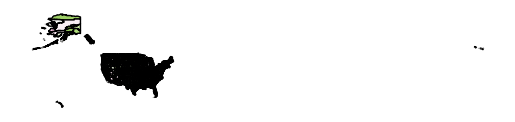

In [27]:
us_counties.plot(column='ec_county', 
                    cmap='PiYG', 
                    edgecolor='k', 
                    legend_kwds={"label": "EC Index"}, 
                    #legend=True
                   )

plt.axis("off")

Let's select only the contiguous US

In [28]:
us_counties.STATEFP.unique()

array(['39', '06', '12', '17', '28', '30', '36', '42', '29', '02', '04',
       '13', '21', '27', '41', '47', '48', '55', '05', '20', '19', '46',
       '31', '01', '08', '26', '35', '16', '18', '37', '40', '54', '38',
       '49', '51', '53', '56', '23', '32', '33', '25', '22', '45', '24',
       '50', '15', '34', '10', '44', '09', '11'], dtype=object)

In [29]:
fips_ext = ['02','15'] #these are the fips codes of Alaska and Hawaii

In [30]:
us_counties_cont = us_counties[~us_counties.STATEFP.isin(fips_ext)]

(-127.62233794999999, -64.06073105, 23.2714922, 50.6278278)

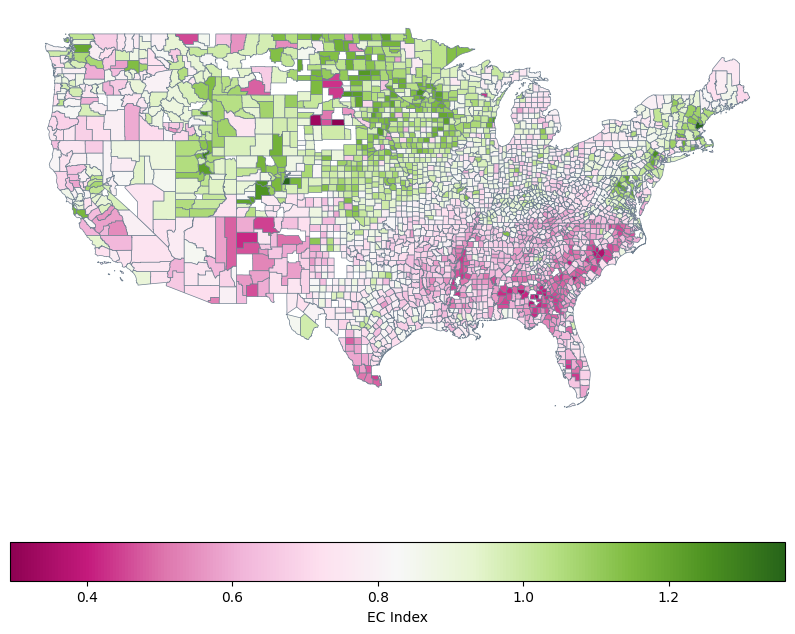

In [31]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

us_counties_cont.plot(column='ec_county', 
                    cmap='PiYG', 
                    edgecolor='slategrey',
                    linewidth=0.5,
                    legend_kwds={"label": "EC Index", "orientation":"horizontal"}, 
                    legend=True,
                    ax = ax
)

plt.axis("off")

# 2. Statsmodels

`statsmodels` is a Python module that provides classes and functions for the estimation of many different statistical models, as well as for conducting statistical tests, and statistical data exploration. 

An extensive list of result statistics are available for each estimator. The results are tested against existing statistical packages to ensure that they are correct. The package is released under the open source Modified BSD (3-clause) license. The online documentation is hosted at [statsmodels.org](http://statsmodels.org).

### Ordinary least squares

In [32]:
import statsmodels.api as sm

In [33]:
from patsy import dmatrices

In [34]:
us_counties.columns

Index(['STATEFP', 'COUNTYFP', 'COUNTYNS', 'AFFGEOID', 'GEOID', 'NAME', 'LSAD',
       'ALAND', 'AWATER', 'geometry', 'county', 'county_name', 'num_below_p50',
       'pop2018', 'ec_county', 'ec_se_county', 'child_ec_county',
       'child_ec_se_county', 'ec_grp_mem_county', 'ec_high_county',
       'ec_high_se_county', 'child_high_ec_county', 'child_high_ec_se_county',
       'ec_grp_mem_high_county', 'exposure_grp_mem_county',
       'exposure_grp_mem_high_county', 'child_exposure_county',
       'child_high_exposure_county', 'bias_grp_mem_county',
       'bias_grp_mem_high_county', 'child_bias_county',
       'child_high_bias_county', 'clustering_county', 'support_ratio_county',
       'volunteering_rate_county', 'civic_organizations_county'],
      dtype='object')

In [35]:
vars = ['ec_county', 'num_below_p50', 'clustering_county', 'support_ratio_county', 'volunteering_rate_county']

In [36]:
df_model = us_counties[vars]

In [37]:
df_model

,ec_county,num_below_p50,clustering_county,support_ratio_county,volunteering_rate_county
0,0.73097,6667.95070,0.110630,0.991940,0.107120
1,NaN,168.09541,0.091637,0.877699,0.146537
2,0.68266,38978.13300,0.089380,0.989720,0.055760
3,0.77242,1963.72310,0.132110,0.997770,0.091060
4,0.67898,4560.67090,0.153870,0.998550,0.057650
...,...,...,...,...,...
3084,0.85508,12521.42200,0.100340,0.990550,0.064280
3085,0.81159,21072.46300,0.094170,0.986900,0.085830
3086,0.57917,1285.06190,0.201100,0.997710,0.014400
3087,0.97249,18540.95900,0.097060,0.979710,0.118860


We remove the NaN values

In [40]:
df_model = df_model.dropna()

In [41]:
y, X = dmatrices('ec_county ~ clustering_county + support_ratio_county + volunteering_rate_county + num_below_p50', 
                 data=df_model, return_type='dataframe')

In [42]:
y[:10]

,ec_county
0,0.73097
2,0.68266
3,0.77242
4,0.67898
5,0.75365
6,0.83388
7,0.87391
8,0.81028
9,0.87433
10,0.91101


In [43]:
X[:10]

,Intercept,clustering_county,support_ratio_county,volunteering_rate_county,num_below_p50
0,1.0,0.11063,0.99194,0.10712,6667.9507
2,1.0,0.08938,0.98972,0.05576,38978.1330
3,1.0,0.13211,0.99777,0.09106,1963.7231
4,1.0,0.15387,0.99855,0.05765,4560.6709
5,1.0,0.13788,0.99950,0.05405,2630.8245
6,1.0,0.10340,0.98913,0.09121,1511.9717
7,1.0,0.09890,0.97807,0.08142,19730.4530
8,1.0,0.13515,0.99805,0.10306,2476.5327
9,1.0,0.08897,0.97916,0.11566,25945.7890
10,1.0,0.14200,0.99833,0.11908,1058.6598


In [44]:
mod = sm.OLS(y, X)

In [45]:
res = mod.fit()

In [46]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:              ec_county   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.257
Method:                 Least Squares   F-statistic:                     261.2
Date:                Mon, 22 Jan 2024   Prob (F-statistic):          6.65e-193
Time:                        10:06:46   Log-Likelihood:                 1393.8
No. Observations:                3016   AIC:                            -2778.
Df Residuals:                    3011   BIC:                            -2748.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

In [47]:
res.params

Intercept                   3.266822e+00
clustering_county          -1.561429e+00
support_ratio_county       -2.447192e+00
volunteering_rate_county    1.981135e+00
num_below_p50              -4.702819e-07
dtype: float64

Many more statistical methods are available through `statsmodels`. 

Check the documentation here: https://www.statsmodels.org/stable/user-guide.html

# 2. NetworkX

NetworkX is a Python package for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks. It provides:

* tools for the study of the structure and dynamics of social, biological, and infrastructure networks;

* a standard programming interface and graph implementation that is suitable for many applications;

* a rapid development environment for collaborative, multidisciplinary projects;

* an interface to existing numerical algorithms and code written in C, C++, and FORTRAN; and

* the ability to painlessly work with large nonstandard data sets.

With NetworkX you can load and store networks in standard and nonstandard data formats, generate many types of random and classic networks, analyze network structure, build network models, design new network algorithms, draw networks, and much more.

In [48]:
import networkx as nx

Let's create an empty graph

In [49]:
G = nx.Graph()

In [50]:
G.add_nodes_from(['Luca','Andrea','Sara','Carlo','Veronica'])

In [51]:
G.nodes()

NodeView(('Luca', 'Andrea', 'Sara', 'Carlo', 'Veronica'))

Add another node

In [54]:
G.add_node('Giovanni')

print("The nodes of G are: ", G.nodes())

The nodes of G are:  ['Luca', 'Andrea', 'Sara', 'Carlo', 'Veronica', 'Giovanni']


So far we have nodes in the networks but no edges.
Let's add edges from a list of tuples.

In [56]:
G.add_edges_from([('Luca','Sara'),('Andrea','Luca'),
('Carlo','Veronica'),('Sara','Veronica'),('Giovanni','Andrea')])

We add another edge and 'Lucia' is a new node.

In [57]:
G.add_edge('Veronica','Lucia')

print("The nodes of G are : ", G.nodes())
print('---')
print("The links of G are : ", G.edges())


The nodes of G are :  ['Luca', 'Andrea', 'Sara', 'Carlo', 'Veronica', 'Giovanni', 'Lucia']
---
The links of G are :  [('Luca', 'Sara'), ('Luca', 'Andrea'), ('Andrea', 'Giovanni'), ('Sara', 'Veronica'), ('Carlo', 'Veronica'), ('Veronica', 'Lucia')]


In [58]:
G.nodes['Lucia']

{}

In [59]:
for n in G.nodes():
    if n[0]=='L':
        G.nodes[n]['age']=24
    else:
        G.nodes[n]['age']=28

#show the nodes with their age
print(G.nodes(data=True))

[('Luca', {'age': 24}), ('Andrea', {'age': 28}), ('Sara', {'age': 28}), ('Carlo', {'age': 28}), ('Veronica', {'age': 28}), ('Giovanni', {'age': 28}), ('Lucia', {'age': 24})]


How to remove a node?

In [60]:
G.remove_node('Luca')
print(G.nodes(data=True))
print('---')
print(G.edges())

[('Andrea', {'age': 28}), ('Sara', {'age': 28}), ('Carlo', {'age': 28}), ('Veronica', {'age': 28}), ('Giovanni', {'age': 28}), ('Lucia', {'age': 24})]
---
[('Andrea', 'Giovanni'), ('Sara', 'Veronica'), ('Carlo', 'Veronica'), ('Veronica', 'Lucia')]


In [61]:
G.remove_edge('Giovanni', 'Andrea')

Degree is easily accessible

In [63]:
G.degree('Veronica')

3

In [64]:
G.degree()

DegreeView({'Andrea': 0, 'Sara': 1, 'Carlo': 1, 'Veronica': 3, 'Giovanni': 0, 'Lucia': 1})

In [65]:
for i in G.degree():
    print(i[0], G.degree()[i[0]])

Andrea 0
Sara 1
Carlo 1
Veronica 3
Giovanni 0
Lucia 1


## Visualizing a network with NetworkX

NetworkX combined with matplotlib can be used to visualize complex networks. 

It provides a good range of functionalities to obtain some basic and more refined visualization. More details are available in the [documentation](https://networkx.github.io/documentation/stable/reference/drawing.html).

We generate a random Erdos-Rényi network and visualize it.

In [66]:
N=100
prob=0.08

In [68]:
ER=nx.erdos_renyi_graph(N, prob)

(-1.0310160953310572,
 0.9880293941656264,
 -1.19647387910251,
 1.0676536800787981)

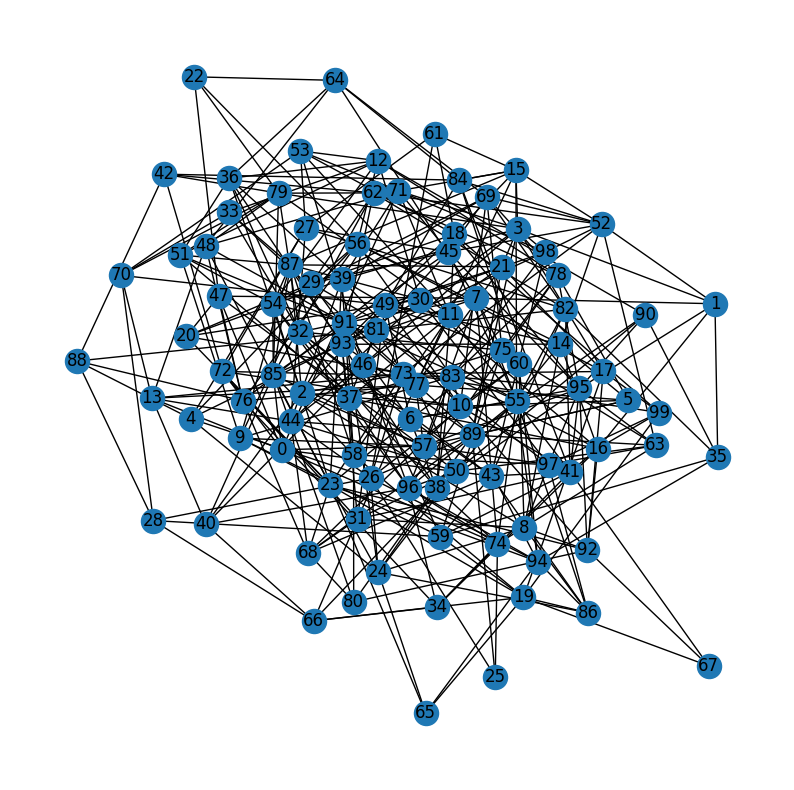

In [69]:
plt.figure(figsize=(10,10))

nx.draw_networkx(ER)

plt.axis('off')

In [70]:
pos=nx.spring_layout(ER)
pos

{0: array([ 0.3773915 , -0.23615574]),
 1: array([-0.12840096,  0.42511833]),
 2: array([0.31985787, 0.1242077 ]),
 3: array([-0.11042135, -0.01561848]),
 4: array([-0.49675333, -0.34082334]),
 5: array([0.32884529, 0.52450084]),
 6: array([ 0.29146936, -0.26726953]),
 7: array([ 0.42969125, -0.00282698]),
 8: array([-0.45872247,  0.22806773]),
 9: array([0.52452682, 0.26004974]),
 10: array([-0.08623168, -0.04079011]),
 11: array([-0.10383374, -0.2217748 ]),
 12: array([0.53624475, 0.11693221]),
 13: array([ 0.40597172, -0.14792746]),
 14: array([-0.01114706,  0.3731177 ]),
 15: array([-0.26107582, -0.38978634]),
 16: array([0.02583747, 0.61930581]),
 17: array([-0.25142388,  0.65344924]),
 18: array([-0.34622765, -0.11082854]),
 19: array([-0.58032953,  0.54540702]),
 20: array([0.43251257, 0.36714527]),
 21: array([-0.04553683,  0.46476857]),
 22: array([ 0.8844293 , -0.34194389]),
 23: array([-0.10592669,  0.07455593]),
 24: array([-0.44300314, -0.03854248]),
 25: array([-0.7565696

We can draw the network nodes only, and assign a specific location to each node.

(-1.0440200348948687,
 1.0676756165973667,
 -1.1875533512306211,
 0.9737757439032017)

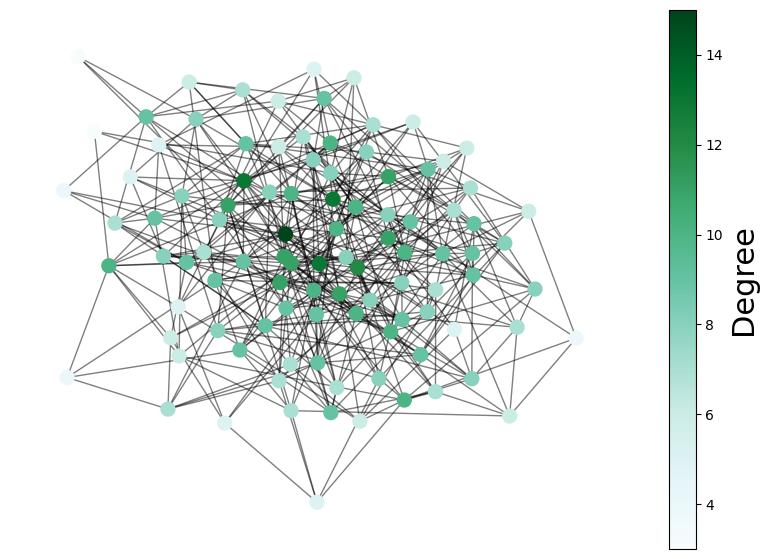

In [72]:
plt.figure(figsize=(10,7))

s=nx.draw_networkx_nodes(ER,
                        pos,
            node_size=100.0,
            node_color=list(dict(nx.degree(ER)).values()),
            alpha=1,
            cmap='BuGn'
            )

nx.draw_networkx_edges(ER, pos, alpha=0.5)

#show the colorbar on the right side
cbar=plt.colorbar(s)
cbar.ax.set_ylabel('Degree', size=22)

plt.axis('off')

We can load a network from a file. Let's see an example.

We analyze the US airport network of year 2010. 
The network is available from the [network repository of Tore Opshal](https://toreopsahl.com/datasets/#usairports).

Weights represent the total number of passengers who traveled on that connection in a year.

Airport coordinates have been added by myself.


In [73]:
airport_path='./../data/USairport_2010.txt'
meta_path='./../data/USairport_2010_codes.txt'

In [74]:
G=nx.Graph()
fh=open(airport_path,'r')
for line in fh.readlines():
    s=line.strip().split()
    G.add_edge(int(s[0]),int(s[1]))
fh.close()  

In [75]:
len(G)

405

We define three dictionaries associated to the network to store additional node's features: IATA code, aiport name, geographic coordinates.

In [76]:
G.code={}
G.name={}
G.pos={}

We extract nodes features from a file

In [77]:
finfo=open(meta_path,'r')
for line in finfo.readlines():
    s=line.strip().split()
    node=int(s[0])
    G.code[node]=s[1]
    G.name[node]=s[2]
    G.pos[node]=(float(s[4]), float(s[3]))
finfo.close() 

Draw the network

(-127.04962499999999, -65.237875, 23.3436116, 50.0063884)

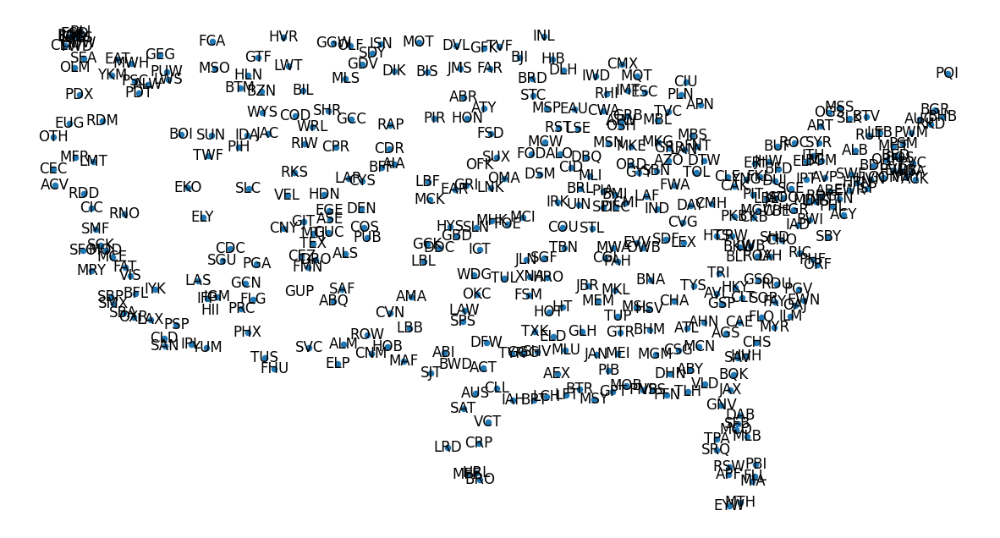

In [78]:
fig=plt.figure(figsize=(15,8))

nx.draw_networkx_nodes(G,
            pos=G.pos,
            node_size=20
            )

#nx.draw_networkx_edges(G,pos=G.pos)

nx.draw_networkx_labels(G, pos=G.pos, labels=G.code)

plt.axis('off')

We would like to draw the edges but there are too many of them.

In [79]:
len(G.edges())

8251

We select only the strongest connections as a subgraph of G by setting a threshold on the annual passengers volume.

In [80]:
weight_threshold=300000

In [81]:
H=nx.Graph()

H.pos={}
H.code={}
H.name={}

fh=open(airport_path,'r')
for line in fh.readlines():
    s=line.strip().split()
    node1=int(s[0])
    node2=int(s[1])
    
    weight=int(s[2])
    
    if weight>weight_threshold:
        H.add_edge(node1,node2)
        
        H.pos[node1]=G.pos[node1]
        H.pos[node2]=G.pos[node2]
        
        H.code[node1]=G.code[node1]
        H.code[node2]=G.code[node2]
        
        H.name[node1]=G.name[node1]
        H.name[node2]=G.name[node2]
        
fh.close()

In [82]:
len(H.edges())

205

In [84]:
import math

(-128.0307916725, -65.1911527775, 23.3436116, 50.0063884)

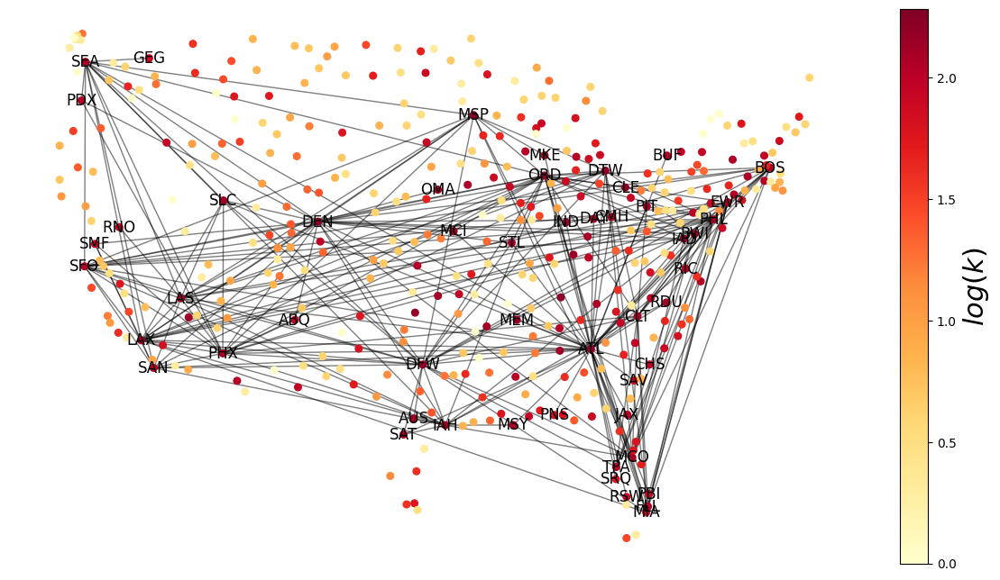

In [85]:
fig=plt.figure(figsize=(15,8))

colors = [math.log(G.degree(v), 10) for v in G]

s=nx.draw_networkx_nodes(G,
            pos=G.pos,
            node_color=colors,
            node_size=30,
            cmap='YlOrRd'
            )

nx.draw_networkx_edges(H,
            pos=G.pos,
            alpha=0.5
            )

nx.draw_networkx_labels(H,
            pos=H.pos,
            labels=H.code,
            )

cbar=plt.colorbar(s)
cbar.ax.set_ylabel('$log(k)$', size=22)

plt.axis('off')

(-127.62233794999999, -64.06073105, 23.2714922, 50.6278278)

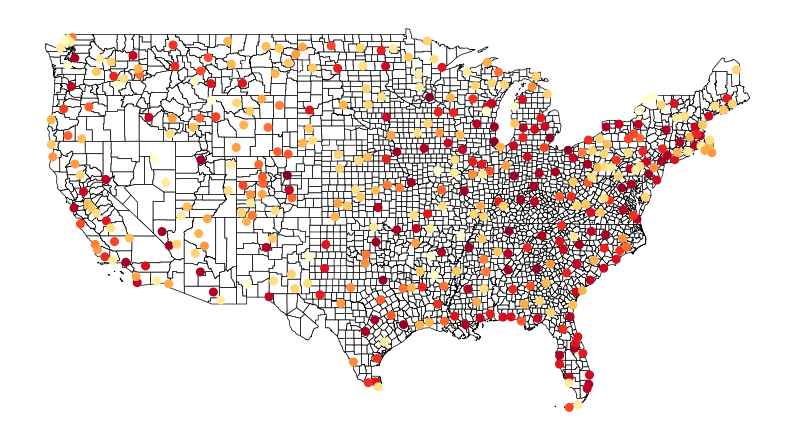

In [91]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

us_counties_cont.plot(color='w', edgecolor='k',linewidth=0.5,  ax = ax)

s=nx.draw_networkx_nodes(G,
            pos=G.pos,
            node_color=colors,
            node_size=30,
            cmap='YlOrRd'
            )


plt.axis("off")